# Sound Event Classification

## Requirements

In [ ]:
%pip install -r requirements.txt

# installa anche nnAudio

Note: you may need to restart the kernel to use updated packages.


## Libraries

In [29]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import librosa
import sklearn
import tensorflow as tf
import IPython
import tqdm
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping, ModelCheckpoint
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
plt.style.use("seaborn-v0_8")

from audiomentations import AddGaussianSNR, PitchShift, TimeStretch, ApplyImpulseResponse
from pedalboard import Pedalboard, Compressor

import torch
import torch.nn as nn           # it contains the neural network modules
import torch.nn.functional as F # it contains the activation functions
from torch.utils.data import Dataset, DataLoader

from gammatone.gtgram import gtgram
from nnAudio.features import Gammatonegram

## Device Selection

In [2]:
#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # windows
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu") # macOS

Device Check:

In [3]:
device

device(type='mps')

## Dataset

Required [ESC-50 Dataset](https://github.com/karolpiczak/ESC-50/archive/master.zip)

### Loading of the dataset of the metadata and dataset analysis

In [4]:
fn_csv = 'ESC-50-master/meta/esc50.csv'

ds_files = []  # File list
ds_labels = []  # Class list

ds = pd.read_csv(fn_csv)
ds.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [5]:
#unique class labels
unique_classes = ds['category'].unique()
print("Unique classes:", unique_classes)

# Check the number of unique class labels
print("Count:", len(unique_classes))

# Filling the lists with filenames and labels
ds_files = ds['filename'].values
pure_ds_labels = ds['category'].values

Unique classes: ['dog' 'chirping_birds' 'vacuum_cleaner' 'thunderstorm' 'door_wood_knock'
 'can_opening' 'crow' 'clapping' 'fireworks' 'chainsaw' 'airplane'
 'mouse_click' 'pouring_water' 'train' 'sheep' 'water_drops'
 'church_bells' 'clock_alarm' 'keyboard_typing' 'wind' 'footsteps' 'frog'
 'cow' 'brushing_teeth' 'car_horn' 'crackling_fire' 'helicopter'
 'drinking_sipping' 'rain' 'insects' 'laughing' 'hen' 'engine' 'breathing'
 'crying_baby' 'hand_saw' 'coughing' 'glass_breaking' 'snoring'
 'toilet_flush' 'pig' 'washing_machine' 'clock_tick' 'sneezing' 'rooster'
 'sea_waves' 'siren' 'cat' 'door_wood_creaks' 'crickets']
Count: 50


# esempi

Check whether Ydata is balanced or not by plotting the histogram.

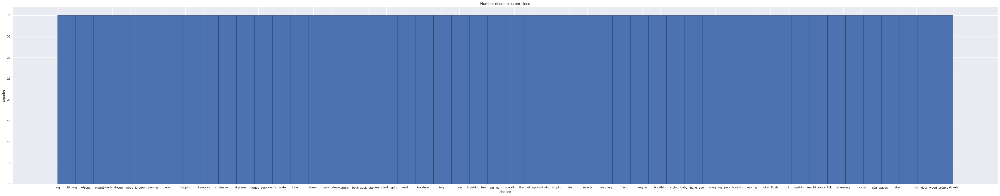

In [6]:
plt.figure(figsize=(55, 10))
plt.title("Number of samples per class")
plt.hist(np.asarray(pure_ds_labels), bins=50, edgecolor='black') 
plt.xlabel("classes")
plt.ylabel("samples")
plt.show()

Transient sound:


Continous sound:


Intermittent sound:


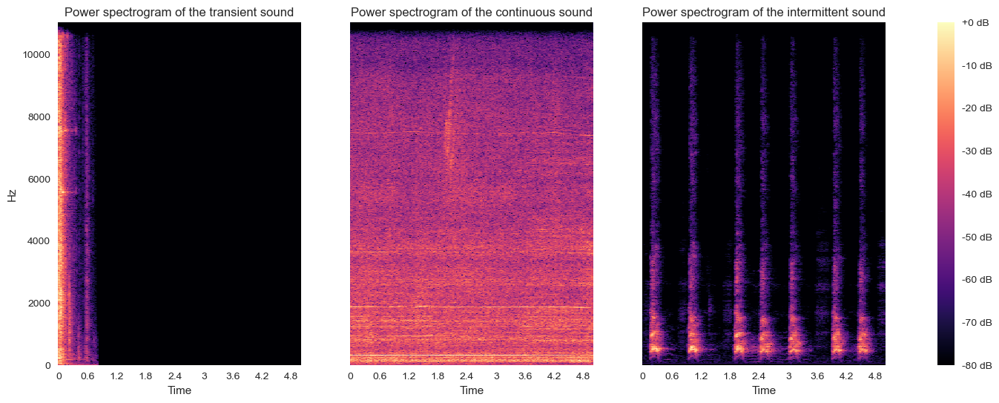

In [7]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-84705-A-39.wav'  # Transient
file1 = path + '1-19872-A-36.wav'  # Continuous
file2 = path + '1-30344-A-0.wav'   # Intermittent

name = ['transient', 'continuous', 'intermittent']

# Show audio player for each file
print('Transient sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Continous sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Intermittent sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Fra quelli simili si fa confusione: se vuelve loco

Washing machine sound:


Helicopter sound:


Engine sound:


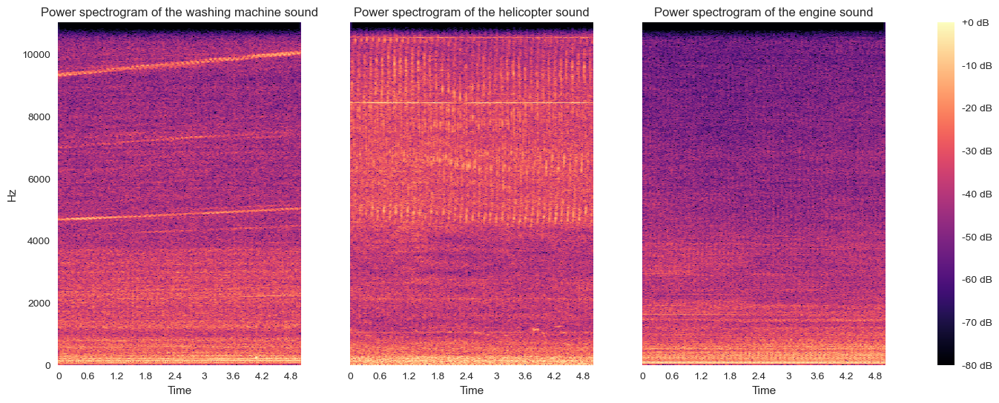

In [8]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-23996-B-35.wav'     # La Lavadora
file1 = path + '1-172649-A-40.wav'    # El helicoptero
file2 = path + '5-232272-A-44.wav'    # El coche


name = ['washing machine', 'helicopter', 'engine']

# Show audio player for each file
print('Washing machine sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Helicopter sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Engine sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Se vogliamo mettere come c'è un'alta variabilità nella stessa classe. Vogliamo l'abbaio 

First dog sound:


Second dog sound:


Third dog sound:


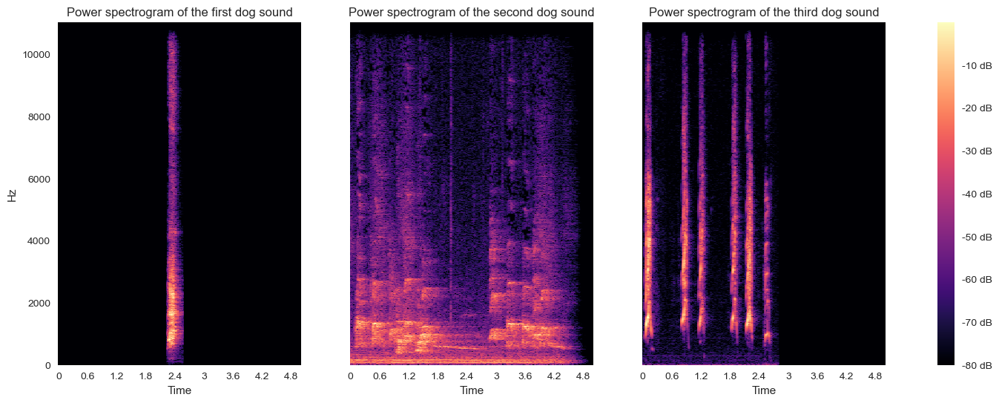

In [9]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-100032-A-0.wav'     # El perro limpio
file1 = path + '3-136288-A-0.wav'     # El perro en la lavadora
file2 = path + '5-9032-A-0.wav'       # El perro sucio

name = ['first dog', 'second dog', 'third dog']

# Show audio player for each file
print('First dog sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Second dog sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Third dog sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Un'altra cosa da far notare è che non esiste una vera conoscenza e struttura di suoni ambientali ('o ritmo, o suono, 'o mare). Harmonic percussion

Harmonic component


Percussive component


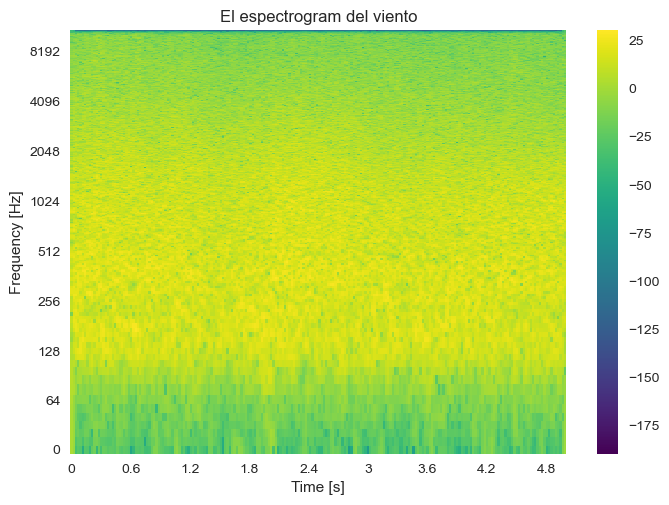

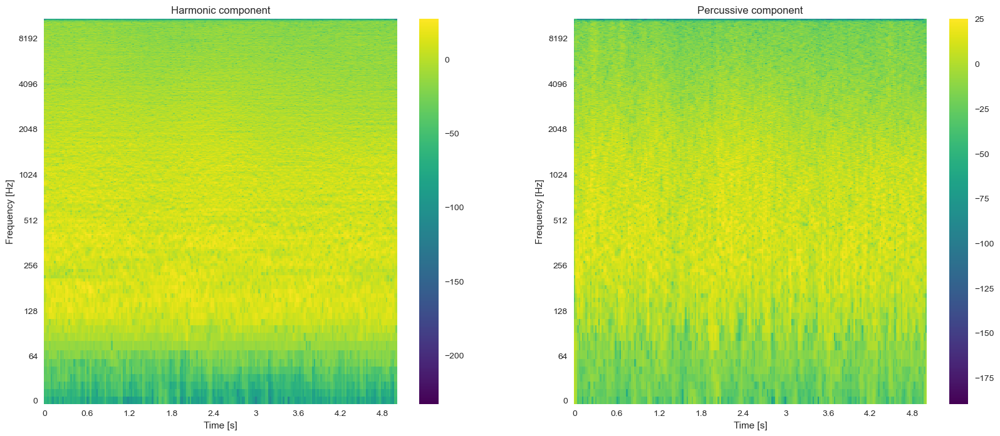

In [10]:
path = 'ESC-50-master/audio/'
file0 = path + '1-51037-A-16.wav'     # El viento

sound, sr = librosa.load(file0)

S = librosa.stft(sound)

librosa.display.specshow(20*np.log10(np.abs(S)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'El espectrogram del viento')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

Hmm, Prs = librosa.decompose.hpss(S)

plt.figure(figsize=(20,8))

plt.subplot(1, 2, 1)
librosa.display.specshow(20*np.log10(np.abs(Hmm)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Harmonic component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

plt.subplot(1, 2, 2)
librosa.display.specshow(20*np.log10(np.abs(Prs)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Percussive component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

print(f'Harmonic component')
IPython.display.display(IPython.display.Audio(librosa.istft(Hmm), rate=sr))
print(f'Percussive component')
IPython.display.display(IPython.display.Audio(librosa.istft(Prs), rate=sr))

# Pre-processing

Required [MIT Acoustical Reverberation Scene Statistics Survey](https://mcdermottlab.mit.edu/Reverb/IRMAudio/Audio.zip)

We decided to use audiomentations instead of the PyTorch one in order to have compressors.
-	Add different background noises with different SNRs
-	Pitch shifting
-	Time stretching
-	Dynamic range compression
-	Convolution with impulse responses

Background noise

In [11]:
def addGaussianNoise(signal, sr, min_snr_db, max_snr_db, activation_prob):
    """
    Adds Gaussian noise to the audio signal with a specified SNR range and activation probability.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_snr_db (float): Minimum SNR in dB.
        max_snr_db (float): Maximum SNR in dB.
        activation_prob (float): Probability of applying the augmentation.
    Returns:
        np.ndarray: The augmented audio signal with Gaussian noise added.
    """
    
    transform = AddGaussianSNR(
        min_snr_db=min_snr_db,
        max_snr_db=max_snr_db,
        p=activation_prob
    )
    augmented_signal = transform(samples=signal, sample_rate=sr)
    return augmented_signal

Pitch Shifting

In [12]:
def pitchShifter(signal, sr, min_semitones, max_semitones, activation_prob):
    """
    Shifts the pitch of the audio signal by a random number of semitones within a specified range.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_semitones (int): Minimum number of semitones to shift.
        max_semitones (int): Maximum number of semitones to shift.
        activation_prob (float): Probability of applying the augmentation.
    Returns:
        np.ndarray: The augmented audio signal with pitch shifted.
    """
    
    transform = PitchShift(
        min_semitones=min_semitones,
        max_semitones=max_semitones,
        p=activation_prob
    )
    augmented_signal = transform(samples=signal, sample_rate=sr)
    return augmented_signal

Time Stretching 

In [13]:
def timeStretcher(signal, sr, min_rate, max_rate, activation_prob, leave_length_unchanged=True):
    """
    Stretches or compresses the audio signal in time by a random factor within a specified range.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_rate (float): Minimum stretch/compression rate.
        max_rate (float): Maximum stretch/compression rate.
        activation_prob (float): Probability of applying the augmentation.
        leave_length_unchanged (bool): If True, the length of the output signal will be the same as the input.
    Returns:
        np.ndarray: The augmented audio signal with time-stretching applied.
    """
    
    transform = TimeStretch(
        min_rate=min_rate,
        max_rate=max_rate,
        leave_length_unchanged=leave_length_unchanged,
        p=activation_prob
    )

    augmented_sound = transform(signal, sample_rate=sr)
    return augmented_sound

Compressor

In [14]:
def compressor(signal, sr, threshold_db, ratio, attack_ms, release_ms):
    """
    Applies a compressor to the audio signal.
    Args:
        signal (np.ndarray): The audio signal to compress.
        sr (int): Sample rate of the audio signal.
        threshold_db (float): Threshold in dB for the compressor.
        ratio (float): Compression ratio.
        attack_ms (int): Attack time in milliseconds.
        release_ms (int): Release time in milliseconds.
    Returns:
        np.ndarray: The compressed audio signal.
    """

    original_dtype = signal.dtype
    
    if signal.ndim == 1:
        signal = np.expand_dims(signal, axis=1)  # from [samples] to [samples, 1]
    
    signal = signal.T  # from [samples, channels] to [channels, samples]

    board = Pedalboard([
        Compressor(threshold_db=threshold_db, ratio=ratio, attack_ms=attack_ms, release_ms=release_ms),
    ])

    processed = board(signal, sr)  # output shape: [channels, samples]

    # Back to [samples, channels]
    augmented_sound = processed.T

    # Convert to the original dtype
    if augmented_sound.dtype != original_dtype:
        if np.issubdtype(original_dtype, np.integer):
            max_val = np.max(np.abs(augmented_sound))
            if max_val > 0:
                normalized = augmented_sound / max_val
            else:
                normalized = augmented_sound
            info = np.iinfo(original_dtype)
            scaled = (normalized * info.max).clip(info.min, info.max).astype(original_dtype)
            augmented_sound = scaled
        else:
            augmented_sound = augmented_sound.astype(original_dtype)

    augmented_sound = np.squeeze(augmented_sound)  # Remove any singleton dimensions

    return augmented_sound

Impulse respones convolution

In [15]:
def convolver(signal, sr, activation_prob):
    """
    Applies an impulse response to the audio signal to simulate reverberation.
    Args:
        signal (np.ndarray): The audio signal to convolve.
        sr (int): Sample rate of the audio signal.
        activation_prob (float): Probability of applying the convolution.
    Returns:
        np.ndarray: The augmented audio signal with convolution applied.
    """
    
    transform = ApplyImpulseResponse(ir_path="MIT_Acoustical_Reverberation_Scene", p=activation_prob)

    augmented_sound = transform(signal, sample_rate=sr)

    return augmented_sound

Pre-processing for a single track

In [16]:
def preProcessingSignal(
    signal, sr,
    label,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None
    ):
    """
    Preprocesses the audio signal by applying various augmentations based on the provided parameters.
    Args:
        signal (np.ndarray): The audio signal to preprocess.
        sr (int): Sample rate of the audio signal.
        label (str): Label for the audio signal.
        gaussianParameters (tuple, optional): Parameters for Gaussian noise augmentation (min_snr_db, max_snr_db, activation_prob).
        pitchParameters (tuple, optional): Parameters for pitch shifting (min_semitones, max_semitones, activation_prob).
        timeStretchParameters (tuple, optional): Parameters for time stretching (min_rate, max_rate, activation_prob, leave_length_unchanged).
        compressorParameters (tuple, optional): Parameters for compression (threshold_db, ratio, attack_ms, release_ms).
        convolverParameters (float, optional): Probability of applying convolution with impulse response.
    Returns:
        tuple: A tuple containing a list of processed signals and their corresponding labels.
    """
    
    signals = []
    labels = []

    signals.append(signal)
    labels.append(label)

    if gaussianParameters is not None:
        min_snr_db, max_snr_db, activation_prob = gaussianParameters
        signal_1 = addGaussianNoise(signal, sr, min_snr_db, max_snr_db, activation_prob)
        #print(f"Added Gaussian noise with SNR range: {min_snr_db} to {max_snr_db} dB, activation probability: {activation_prob}")
        signals.append(signal_1)
        labels.append(label)
    
    if pitchParameters is not None:
        min_semitones, max_semitones, activation_prob = pitchParameters
        signal_2 = pitchShifter(signal, sr, min_semitones, max_semitones, activation_prob)
        #print(f"Pitch shifted by {min_semitones} to {max_semitones} semitones, activation probability: {activation_prob}")
        signals.append(signal_2)
        labels.append(label)

    if timeStretchParameters is not None:
        min_rate, max_rate, activation_prob, leave_length_unchanged = timeStretchParameters
        signal_3 = timeStretcher(signal, sr, min_rate, max_rate, activation_prob, leave_length_unchanged)
        #print(f"Time stretched/compressed by a factor of {min_rate} to {max_rate}, activation probability: {activation_prob}, leave length unchanged: {leave_length_unchanged}")
        signals.append(signal_3)
        labels.append(label)

    if compressorParameters is not None:
        threshold_db, ratio, attack_ms, release_ms = compressorParameters
        signal_4 = compressor(signal, sr, threshold_db, ratio, attack_ms, release_ms)
        #print(f"Applied compressor with threshold: {threshold_db} dB, ratio: {ratio}, attack: {attack_ms} ms, release: {release_ms} ms")
        signals.append(signal_4)
        labels.append(label)

    if convolverParameters is not None:
        activation_prob = convolverParameters
        signal_5 = convolver(signal, sr, activation_prob)
        #print(f"Applied convolution with impulse response, activation probability: {activation_prob}")
        signals.append(signal_5)
        labels.append(label)
    
    return signals, labels



Pre-processing for the entire dataset

In [17]:
def preProcessingDataset(
    Xdata, sr,
    Ydata,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None
):
    """
    Preprocesses a dataset of audio signals by applying various augmentations based on the provided parameters.
    Args:
        Xdata (list): List of audio signals to preprocess.
        sr (int): Sample rate of the audio signals.
        Ydata (list): List of labels corresponding to the audio signals.
        gaussianParameters (tuple, optional): Parameters for Gaussian noise augmentation (min_snr_db, max_snr_db, activation_prob).
        pitchParameters (tuple, optional): Parameters for pitch shifting (min_semitones, max_semitones, activation_prob).
        timeStretchParameters (tuple, optional): Parameters for time stretching (min_rate, max_rate, activation_prob, leave_length_unchanged).
        compressorParameters (tuple, optional): Parameters for compression (threshold_db, ratio, attack_ms, release_ms).
        convolverParameters (float, optional): Probability of applying convolution with impulse response.
    Returns:
        tuple: A tuple containing a numpy array of processed signals and a numpy array of their corresponding labels.
    """
    
    all_signals = []
    all_labels = []

    for signal, label in zip(Xdata, Ydata):
        signals, labels = preProcessingSignal(
            signal, sr, label,
            gaussianParameters,
            pitchParameters,
            timeStretchParameters,
            compressorParameters,
            convolverParameters
        )
        all_signals.extend(signals)
        all_labels.extend(labels)

    all_signals = np.asarray(all_signals)
    all_labels = np.asarray(all_labels)

    return all_signals, all_labels

### LOAD SIGNALS

Nos cargamos todos los signales

In [18]:
pure_signals = []
audio_folder = "ESC-50-master/audio/"

for file in ds_files:
    filepath = os.path.join(audio_folder, file)
    pure_signal, sr = librosa.load(filepath)
    pure_signals.append(pure_signal)

Check pre pre-processing

In [19]:
print(f"Number of audio files: {len(pure_signals)}")
print(f"Number of audio labels: {len(pure_ds_labels)}")

Number of audio files: 2000
Number of audio labels: 2000


Lista -> np

In [20]:
pure_signals_array = np.asarray(pure_signals)

# Transform the labels to numbers
label_mapping = {label: idx for idx, label in enumerate(dict.fromkeys(pure_ds_labels))}
numerical_labels = np.array([label_mapping[label] for label in pure_ds_labels])

Ydata = np.asarray(numerical_labels) # Aquí, hay todas las clases

print('Pure signals length: {} \nYata shape: {}'.format(pure_signals_array.shape, Ydata.shape))   

Pure signals length: (2000, 110250) 
Yata shape: (2000,)


### Split between test and train + val

In [21]:
seed = 1234

train_size = 0.7
val_size = 0.2
test_size = 0.1

seed = 1234
X_train, X_temp, y_train, y_temp = train_test_split(pure_signals_array, Ydata, train_size=train_size, random_state=seed, shuffle=True , stratify=Ydata)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=np.round(test_size/(test_size + val_size),2), random_state=seed, shuffle=True , stratify=y_temp)


# Shapes for each partition
print('X_train shape: {} \nX_val shape: {} \nX_test shape: {} \ny_train shape: {} \ny_val shape: {} \ny_test shape: {} \n'.format(X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape))


X_train shape: (1400, 110250) 
X_val shape: (402, 110250) 
X_test shape: (198, 110250) 
y_train shape: (1400,) 
y_val shape: (402,) 
y_test shape: (198,) 



In [22]:
X_train_aug, Y_train_aug = preProcessingDataset(
    Xdata=X_train,
    sr=sr,
    Ydata=y_train,
    gaussianParameters = (5, 40, 1),
    pitchParameters = (-5, 5, 1),
    timeStretchParameters = (0.8, 1.25, 1, True),
    compressorParameters = (-20, 4.0, 10.0, 100.0),
    convolverParameters = 1
)

/opt/miniconda3/envs/ST2025/lib/python3.9/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/annafusari/Desktop/Selected_topics/final_project/CRNN_3/MIT_Acoustical_Reverberation_Scene/h222_StreetsOfcambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/opt/miniconda3/envs/ST2025/lib/python3.9/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/annafusari/Desktop/Selected_topics/final_project/CRNN_3/MIT_Acoustical_Reverberation_Scene/h179_Bar_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/opt/miniconda3/envs/ST2025/lib/python3.9/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/annafusari/Desktop/Selected_topics/final_project/CRNN_3/MIT_Acoustical_Reverberation_Scene/h081_Shower_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/opt/minic

In [23]:
print('X_train_aug shape: {} \nY_train_aug shape: {} \nX_test shape: {} \nY_tes shape: {}\n'.format(X_train_aug.shape, Y_train_aug.shape, X_test.shape, y_test.shape))

type_of_processing = [
    "Original",
    "Gaussian Noise",
    "Pitch Shift",
    "Time Stretch",
    "Compressor",
    "Convolver"
]

# Listen to the first 5 augmented audio files
for i in range(6):
    print(type_of_processing[i])
    IPython.display.display(IPython.display.Audio(data=X_train_aug[i], rate=sr))

X_train_aug shape: (8400, 110250) 
Y_train_aug shape: (8400,) 
X_test shape: (198, 110250) 
Y_tes shape: (198,)

Original


Gaussian Noise


Pitch Shift


Time Stretch


Compressor


Convolver


augmentation on train set

# **Feature Extraction**

In [ ]:
from nnAudio import Spectrogram

def pre_processing(signal, sr=44100, win_time=0.023, hop_time=0.0115, n_filters=128):
    """
    Calcola il gammatonegram e il delta di un segnale audio.

    Args:
        signal (np.ndarray): segnale audio mono.
        sr (int): frequenza di campionamento (default 44100 Hz).
        win_time (float): durata della finestra per STFT (23 ms).
        hop_time (float): hop tra i frame (11.5 ms ≈ 50% overlap).
        n_filters (int): numero di bande gammatone.

    Returns:
        np.ndarray: array di forma (n_filters, time, 2), dove
                    l'ultimo asse contiene [gammatonegram_log, delta].
    """
    audio_tensor = torch.tensor(signal, dtype=torch.float32)
    audio_tensor = audio_tensor / torch.abs(audio_tensor).max()
    audio_tensor = audio_tensor.unsqueeze(0)  # (1, samples)

    win_length = int(win_time * sr)
    hop_length = int(hop_time * sr)

    spec_layer = Spectrogram.Gammatonegram(
        sr=sr,
        n_fft=win_length,
        hop_length=hop_length,
        n_bins=n_filters,
        fmin=50,
        fmax=sr // 2,
        center=False
    )

    with torch.no_grad():
        gtgram = spec_layer(audio_tensor)  # (1, n_filters, time)

    gtgram = gtgram.squeeze(0).cpu().numpy()

    gt_log = 10 * np.log10(gtgram + 1e-10)

    delta = librosa.feature.delta(gt_log)

    return np.stack([gt_log, delta], axis=-1)


In [44]:
X_train_proc = []

for signal in X_train_aug:
    proc = pre_processing(signal)
    X_train_proc.append(proc)

X_train_proc = np.asarray(X_train_proc)
print(f"X_trainval_proc shape: {X_train_proc.shape}")
    

STFT kernels created, time used = 0.0074 seconds
STFT filter created, time used = 0.0019 seconds
Gammatone filter created, time used = 0.0019 seconds
STFT kernels created, time used = 0.0063 seconds
STFT filter created, time used = 0.0014 seconds
Gammatone filter created, time used = 0.0014 seconds
STFT kernels created, time used = 0.0059 seconds
STFT filter created, time used = 0.0018 seconds
Gammatone filter created, time used = 0.0018 seconds
STFT kernels created, time used = 0.0057 seconds
STFT filter created, time used = 0.0017 seconds
Gammatone filter created, time used = 0.0017 seconds
STFT kernels created, time used = 0.0053 seconds
STFT filter created, time used = 0.0017 seconds
Gammatone filter created, time used = 0.0017 seconds
STFT kernels created, time used = 0.0056 seconds
STFT filter created, time used = 0.0017 seconds
Gammatone filter created, time used = 0.0017 seconds
STFT kernels created, time used = 0.0056 seconds
STFT filter created, time used = 0.0014 seconds
Gam

In [ ]:
# Cella per salvare gammatone 
np.save('X_train_proc.npy', X_train_proc)

# Più tardi, per caricare
X_train_proc = np.load('X_train_proc.npy', allow_pickle=True)
print(f"Shape ricaricata: {X_train_proc.shape}")

In [45]:
X_val_proc = []

for signal in X_val:
    proc = pre_processing(signal)
    X_val_proc.append(proc)

X_val_proc = np.asarray(X_val_proc)
print(f"X_trainval_proc shape: {X_val_proc.shape}")

STFT kernels created, time used = 0.0135 seconds
STFT filter created, time used = 0.0061 seconds
Gammatone filter created, time used = 0.0061 seconds
STFT kernels created, time used = 0.0076 seconds
STFT filter created, time used = 0.0058 seconds
Gammatone filter created, time used = 0.0058 seconds
STFT kernels created, time used = 0.0067 seconds
STFT filter created, time used = 0.0033 seconds
Gammatone filter created, time used = 0.0033 seconds
STFT kernels created, time used = 0.0067 seconds
STFT filter created, time used = 0.0045 seconds
Gammatone filter created, time used = 0.0045 seconds
STFT kernels created, time used = 0.0065 seconds
STFT filter created, time used = 0.0032 seconds
Gammatone filter created, time used = 0.0032 seconds
STFT kernels created, time used = 0.0067 seconds
STFT filter created, time used = 0.0027 seconds
Gammatone filter created, time used = 0.0027 seconds
STFT kernels created, time used = 0.0059 seconds
STFT filter created, time used = 0.0032 seconds
Gam

In [46]:
X_test_proc = []

for signal in X_test:
    proc = pre_processing(signal)
    X_test_proc.append(proc)

X_test_proc = np.asarray(X_test_proc)
print(f"X_trainval_proc shape: {X_test_proc.shape}")

STFT kernels created, time used = 0.0147 seconds
STFT filter created, time used = 0.0028 seconds
Gammatone filter created, time used = 0.0028 seconds
STFT kernels created, time used = 0.0088 seconds
STFT filter created, time used = 0.0021 seconds
Gammatone filter created, time used = 0.0022 seconds
STFT kernels created, time used = 0.0073 seconds
STFT filter created, time used = 0.0034 seconds
Gammatone filter created, time used = 0.0034 seconds
STFT kernels created, time used = 0.0065 seconds
STFT filter created, time used = 0.0027 seconds
Gammatone filter created, time used = 0.0027 seconds
STFT kernels created, time used = 0.0078 seconds
STFT filter created, time used = 0.0041 seconds
Gammatone filter created, time used = 0.0042 seconds
STFT kernels created, time used = 0.0064 seconds
STFT filter created, time used = 0.0025 seconds
Gammatone filter created, time used = 0.0025 seconds
STFT kernels created, time used = 0.0080 seconds
STFT filter created, time used = 0.0014 seconds
Gam

# **Feature Extraction con pytorch**

## **fine feature extraction**

In [47]:
#Both the training and testing features are normalized by the global mean and stardard deviation of the training set."

# Reshape in 2D per lo scaler: (num_samples, features)
X_train_flat = X_train_proc.reshape(-1, X_train_proc.shape[-1])  # shape: (N * time * freq, channels)

scaler = StandardScaler()
X_train_flat = scaler.fit_transform(X_train_flat)

X_val_flat = X_val_proc.reshape(-1, X_val_proc.shape[-1])
X_val_flat = scaler.transform(X_val_flat)

# Applica la trasformazione al test set
X_test_flat = X_test_proc.reshape(-1, X_test_proc.shape[-1])
X_test_flat = scaler.transform(X_test_flat)

# Ripristina la shape originale
X_train_norm = X_train_flat.reshape(X_train_proc.shape)
X_val_norm = X_val_flat.reshape(X_val_proc.shape)
X_test_norm = X_test_flat.reshape(X_test_proc.shape)

print('X_trainval_norm shape: {} \nX_test_norm shape: {} \nX_val_norm shape: {} \ny_trainval shape: {} \ny_val shape: {} \ny_test shape: {} \n'.format(X_train_norm.shape, X_test_norm.shape, X_val_norm.shape, y_train.shape, y_val.shape, y_test.shape))


X_trainval_norm shape: (8400, 128, 216, 2) 
X_test_norm shape: (198, 128, 216, 2) 
X_val_norm shape: (402, 128, 216, 2) 
y_trainval shape: (1400,) 
y_val shape: (402,) 
y_test shape: (198,) 



In [56]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FrameAttention(nn.Module):
    def __init__(self, feature_dim):
        super(FrameAttention, self).__init__()
        self.score_dense = nn.Linear(feature_dim, 1)
        self.feature_dim = feature_dim

    def forward(self, x):
        scores = torch.tanh(self.score_dense(x))  # (batch, time, 1)
        scores = scores.squeeze(-1)               # (batch, time)
        weights = F.softmax(scores, dim=1)        # (batch, time)
        weights = weights.unsqueeze(-1)           # (batch, time, 1)
        weighted = x * weights                    # (batch, time, feature_dim)
        output = weighted.sum(dim=1)              # (batch, feature_dim)
        return output

class CRNN3(nn.Module):
    def __init__(self, input_shape, n_classes=50):
        super(CRNN3, self).__init__()
        c, h, w = input_shape  # (channels, height, width)
        self.conv1 = nn.Conv2d(c, 32, kernel_size=(3,5), stride=1, padding=(1,2))
        self.conv2 = nn.Conv2d(32, 32, kernel_size=(3,5), stride=1, padding=(1,2))
        self.bn1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(kernel_size=(4,3), stride=(4,3))

        self.conv3 = nn.Conv2d(32, 64, kernel_size=(3,1), stride=1, padding=(1,0))
        self.conv4 = nn.Conv2d(64, 64, kernel_size=(3,1), stride=1, padding=(1,0))
        self.bn2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=(4,1), stride=(4,1))

        self.conv5 = nn.Conv2d(64, 128, kernel_size=(1,5), stride=1, padding=(0,2))
        self.conv6 = nn.Conv2d(128, 128, kernel_size=(1,5), stride=1, padding=(0,2))
        self.bn3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(kernel_size=(1,3), stride=(1,3))

        self.conv7 = nn.Conv2d(128, 256, kernel_size=(3,3), stride=1, padding=1)
        self.conv8 = nn.Conv2d(256, 256, kernel_size=(3,3), stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.pool4 = nn.MaxPool2d(kernel_size=(2,2), stride=(2,2))

        self.dropout = nn.Dropout(0.5)

        # Calcola la dimensione delle feature per la GRU
        with torch.no_grad():
            dummy = torch.zeros(1, c, h, w)
            x = F.relu(self.conv1(dummy))
            x = F.relu(self.conv2(x))
            x = self.bn1(x)
            x = self.pool1(x)

            x = F.relu(self.conv3(x))
            x = F.relu(self.conv4(x))
            x = self.bn2(x)
            x = self.pool2(x)

            x = F.relu(self.conv5(x))
            x = F.relu(self.conv6(x))
            x = self.bn3(x)
            x = self.pool3(x)

            x = F.relu(self.conv7(x))
            x = F.relu(self.conv8(x))
            x = self.bn4(x)
            x = self.pool4(x)

            x = x.permute(0, 3, 2, 1)  # (batch, width, height, channels)
            b, t, f, c_ = x.shape
            gru_input_size = f * c_

        self.bigru1 = nn.GRU(input_size=gru_input_size, hidden_size=256, num_layers=1, batch_first=True, bidirectional=True)
        self.bigru2 = nn.GRU(input_size=512, hidden_size=256, num_layers=1, batch_first=True, bidirectional=True)
        self.attention = FrameAttention(feature_dim=512)
        self.fc = nn.Linear(512, n_classes)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.bn1(x)
        x = self.pool1(x)

        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.bn2(x)
        x = self.pool2(x)

        x = F.relu(self.conv5(x))
        x = F.relu(self.conv6(x))
        x = self.bn3(x)
        x = self.pool3(x)

        x = F.relu(self.conv7(x))
        x = F.relu(self.conv8(x))
        x = self.bn4(x)
        x = self.pool4(x)

        x = x.permute(0, 3, 2, 1)  # (batch, width, height, channels)
        b, t, f, c = x.shape
        x = x.reshape(b, t, f * c) # (batch, time, features)

        x, _ = self.bigru1(self.dropout(x))
        x, _ = self.bigru2(self.dropout(x))
        x = self.attention(x)
        x = self.fc(x)
        return x

In [80]:
import pandas as pd
import torch

def train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=300, patience=100, log_filename="training_crnn3.log", model_filename="crnn3_best_model.pth"):
    model.to(device)
    best_acc = 0.0
    best_epoch = 0
    best_model_state = None

    history = {
        "epoch": [],
        "train_loss": [],
        "val_loss": [],
        "train_acc": [],
        "val_acc": []
    }

    patience_counter = 0

    for epoch in range(num_epochs):
        # --- Training ---
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, predicted = outputs.max(1)
            correct += (predicted == targets).sum().item()
            total += targets.size(0)

        train_loss = running_loss / total
        train_acc = correct / total

        # --- Validation ---
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for inputs, targets in val_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_running_loss += loss.item() * inputs.size(0)
                _, predicted = outputs.max(1)
                val_correct += (predicted == targets).sum().item()
                val_total += targets.size(0)

        val_loss = val_running_loss / val_total
        val_acc = val_correct / val_total

        # --- Logging ---
        history["epoch"].append(epoch)
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_acc"].append(train_acc)
        history["val_acc"].append(val_acc)

        # Salva log CSV ad ogni epoca (CSVLogger)
        pd.DataFrame(history).to_csv(log_filename, index=False)

        print(f"Epoch {epoch+1}: Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        # --- Early Stopping & ModelCheckpoint ---
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch
            best_model_state = model.state_dict()
            patience_counter = 0
            # Salva il modello migliore
            torch.save(model.state_dict(), model_filename)
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break

    print(f"Best validation accuracy: {best_acc:.4f} at epoch {best_epoch+1}")
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    return model, history

In [83]:
def plot_training_history(history):

    epochs = range(1, len(history["train_acc"]) + 1)

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_acc"], label="Train Accuracy")
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy")
    plt.title("Accuracy Over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_loss"], label="Train Loss")
    plt.plot(epochs, history["val_loss"], label="Validation Loss")
    plt.title("Loss Over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.tight_layout()
    plt.show()


In [84]:
def plot_training_history(history):

    epochs = range(1, len(history["train_acc"]) + 1)

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_acc"], label="Train Accuracy")
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy")
    plt.title("Accuracy Over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_loss"], label="Train Loss")
    plt.plot(epochs, history["val_loss"], label="Validation Loss")
    plt.title("Loss Over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.tight_layout()
    plt.show()


In [85]:
# --- Dataset e DataLoader ---
class CRNN3Dataset(Dataset):
    def __init__(self, X, y):
        # X shape: (N, H, W, C) oppure (N, C, H, W)
        # Se serve, trasponi per ottenere (N, C, H, W)
        if X.shape[1] != 2:  # Se non è già (N, 2, H, W)
            X = np.transpose(X, (0, 3, 1, 2))  # (N, H, W, C) -> (N, C, H, W)
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Crea i dataset
train_dataset = CRNN3Dataset(X_train_norm, Y_train_aug)
val_dataset = CRNN3Dataset(X_val_norm, y_val)
test_dataset = CRNN3Dataset(X_test_norm, y_test)

In [78]:
def evaluate_model(model, dataloader, device):
    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            y_pred.extend(preds)
            y_true.extend(targets.numpy())

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

    accuracy = np.mean(np.array(y_true) == np.array(y_pred))
    print(f"Test accuracy: {accuracy:.4f}")

Epoch 1: Train Loss: 2.0296, Train Acc: 0.4083 | Val Loss: 1.6967, Val Acc: 0.4851
Epoch 2: Train Loss: 0.9731, Train Acc: 0.7007 | Val Loss: 1.2991, Val Acc: 0.6244
Epoch 3: Train Loss: 0.5648, Train Acc: 0.8254 | Val Loss: 1.3323, Val Acc: 0.6418
Epoch 4: Train Loss: 0.3127, Train Acc: 0.9048 | Val Loss: 1.3154, Val Acc: 0.6443
Epoch 5: Train Loss: 0.2240, Train Acc: 0.9311 | Val Loss: 1.2919, Val Acc: 0.6741
Epoch 6: Train Loss: 0.1494, Train Acc: 0.9586 | Val Loss: 1.4119, Val Acc: 0.6766
Epoch 7: Train Loss: 0.1431, Train Acc: 0.9560 | Val Loss: 1.3297, Val Acc: 0.6716
Epoch 8: Train Loss: 0.0934, Train Acc: 0.9729 | Val Loss: 1.3678, Val Acc: 0.7015
Epoch 9: Train Loss: 0.0981, Train Acc: 0.9706 | Val Loss: 1.3936, Val Acc: 0.6915
Epoch 10: Train Loss: 0.0789, Train Acc: 0.9764 | Val Loss: 1.6525, Val Acc: 0.6517
Epoch 11: Train Loss: 0.0799, Train Acc: 0.9763 | Val Loss: 1.6316, Val Acc: 0.6741
Epoch 12: Train Loss: 0.0712, Train Acc: 0.9796 | Val Loss: 1.4854, Val Acc: 0.6965
E

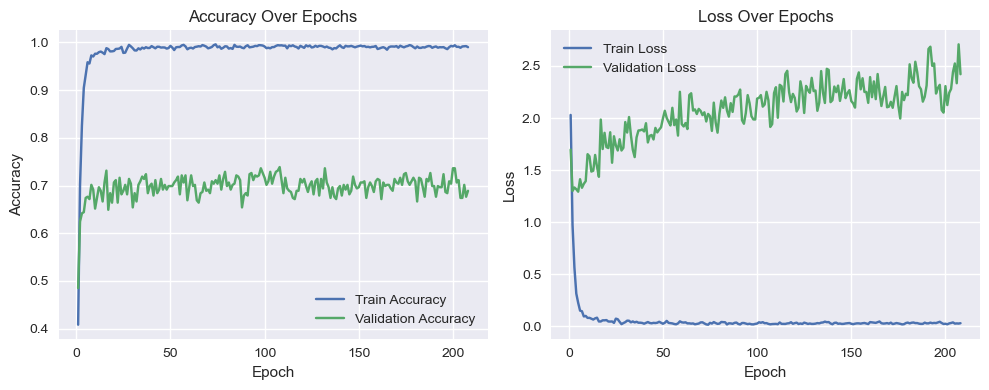

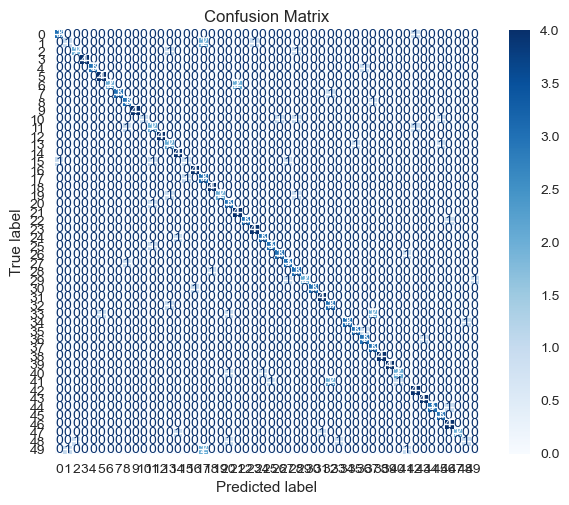

Test accuracy: 0.7071


In [86]:
# --- Creazione dei dataset e dei DataLoader per CRNN3 ---
train_dataset = CRNN3Dataset(X_train_norm, Y_train_aug)
val_dataset = CRNN3Dataset(X_val_norm, y_val)
test_dataset = CRNN3Dataset(X_test_norm, y_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)
test_loader = DataLoader(test_dataset, batch_size=32)

# --- Modello, loss e ottimizzatore ---
input_shape = train_dataset.X.shape[1:]  # (C, H, W)
model = CRNN3(input_shape=input_shape, n_classes=50)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# --- Training ---
model, history = train_model(model, train_loader, val_loader, criterion, optimizer, device)

# --- Plot e valutazione ---
plot_training_history(history)

evaluate_model(model, test_loader, device)